<a href="https://colab.research.google.com/github/SivarajuRanga1002/Camera-Calibration-with-Images/blob/main/Ranga_Homework3_Spring_2024.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!sudo apt-get update -y
!sudo apt-get install python3.10

Hit:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:3 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:4 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:6 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:7 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Reading package lists... Done
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
python3.10 is already the newest version (3.10.12-1~22.04.3).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.


In [ ]:
import numpy as np
import cv2
import glob
from google.colab.patches import cv2_imshow
from google.colab import drive
import os
from PIL import Image


In [ ]:
# !mkdir images
drive.mount('/content/drive')

images_dir = "/content/drive/My Drive/Perception/Assignment3/images"

images_list = os.listdir(images_dir)

image_path_pattern = '/content/images/*.jpg'
image_files = glob.glob(image_path_pattern)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# images_list
# image_path_pattern = '/content/phone_images/*.jpg'


In [ ]:
# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*8,3), np.float32)
square_size = 25 #1mm
objp[:,:2] = np.mgrid[0:8,0:6].T.reshape(-1,2)*square_size

# Arrays to store object points and image points from all the left_images.
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.

# TODO Part A (1): load the list of images in images using glob or any other function.
images = glob.glob(image_path_pattern)

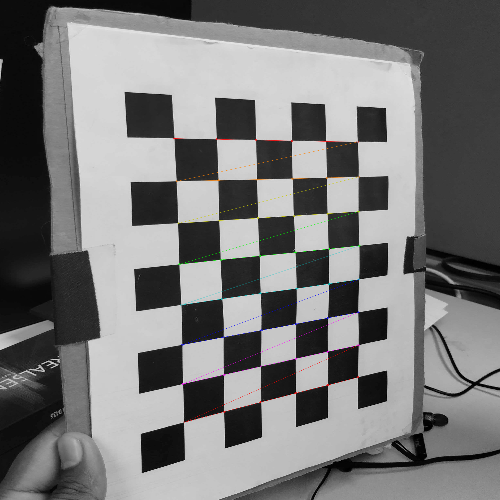

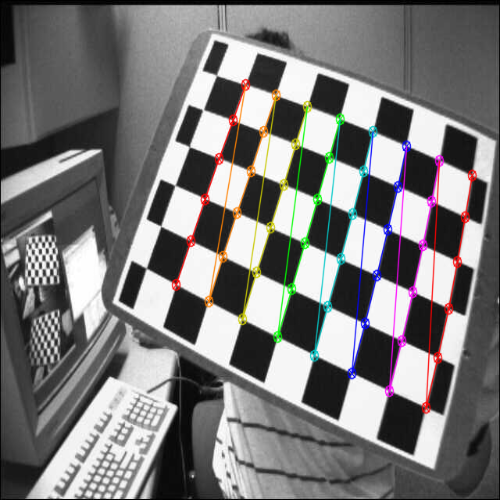

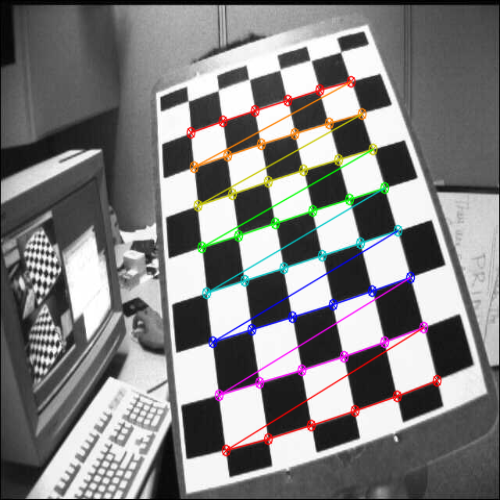

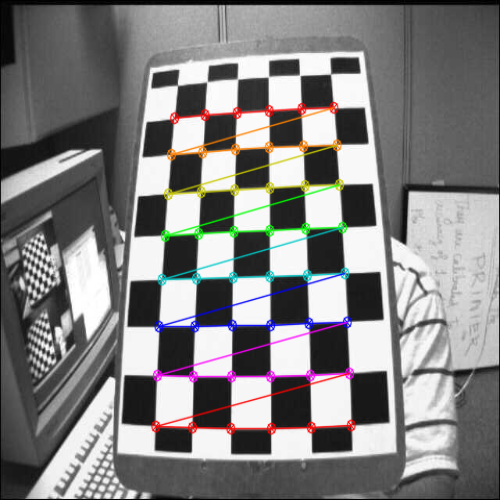

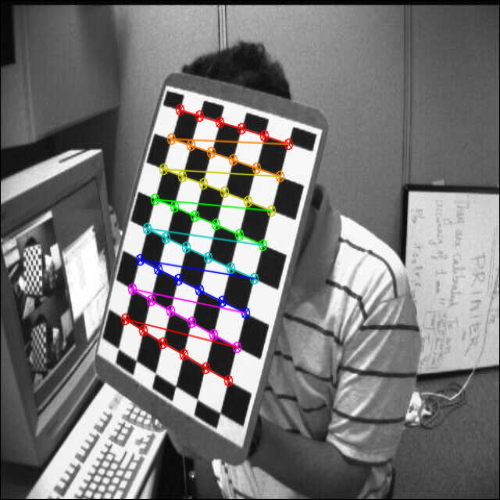

...

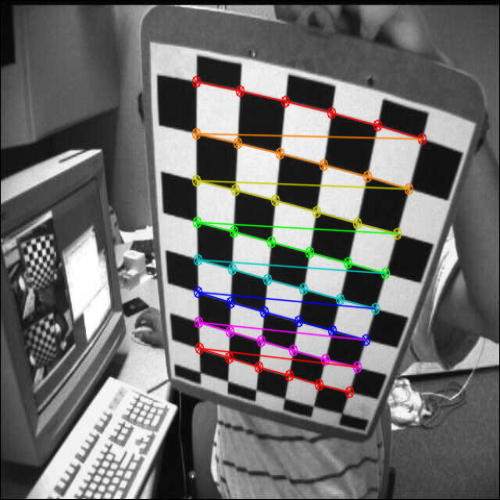

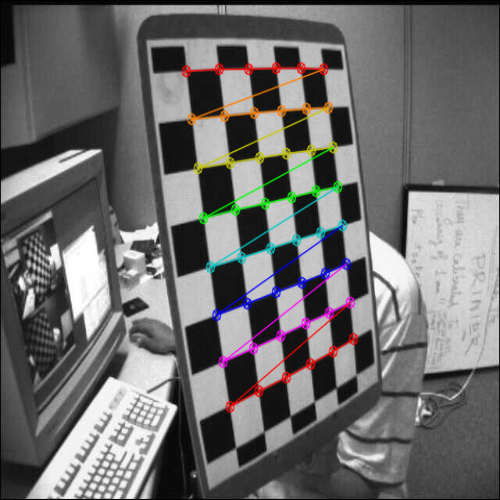

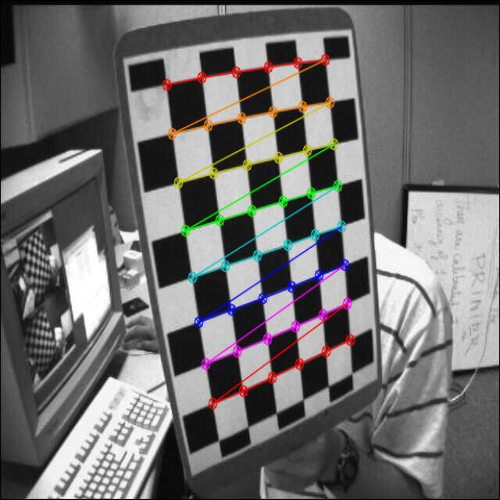

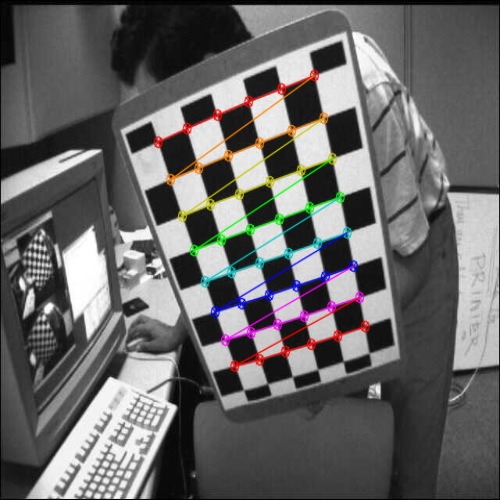

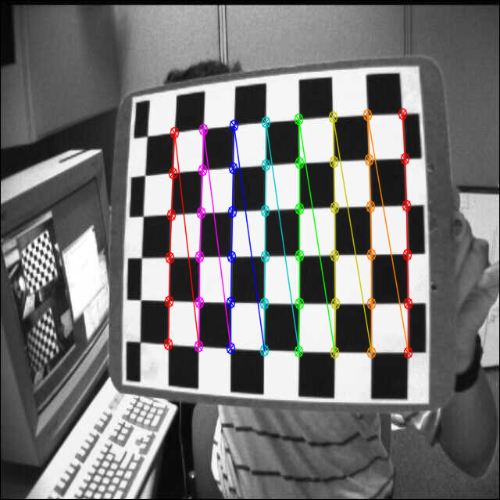

In [ ]:
for fname in images:
    # read image
    # TODO Part A (1): read the image from "fname" using cv2 imread
    img = cv2.imread(fname)
    # TODO Part A (2): convert img to gray scale using cvtColor using cv2.COLOR_BGR2GRAY parameter
    img_gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chess board corners
    chessboard = (6,8)
    # TODO Part A (3): find chess board corners using cv2 findChessboardCorners function, with "gray", grid size
    ret, corners = cv2.findChessboardCorners(img_gray,chessboard,None)

    # If found, add object points, image points (after refining them)
    if ret == True:

        objpoints.append(objp)

        corners2 = cv2.cornerSubPix(img_gray,corners,(11,11),(-1,-1),criteria)
        imgpoints.append(corners2)

        # Draw and display the corners
        # TODO Part A (6): find chess board corners using cv2 drawChessboardCorners function, with "img", grid size, corners2, and ret as parameters
        img_with_corners = cv2.drawChessboardCorners(img, chessboard, corners2, ret)
        img_with_corners = cv2.resize(img_with_corners, (500, 500))
        # TODO Part A (4): display the image using cv2_imshow
        cv2_imshow(img_with_corners)
        cv2.waitKey(500)
cv2.destroyAllWindows()

In [ ]:
# TODO Part A (5): Compute camera matrix using cv2 calibrateCamera with objpoints, imgpoints, gray.shape[::-1] as parameters
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_gray.shape[::-1], None, None)

In [ ]:
img = cv2.imread(images[9])
h,  w = img.shape[:2]

# the new camera matrix is being computed to remove the distortion
newcameramtx, roi=cv2.getOptimalNewCameraMatrix(mtx,dist,(w,h),1,(w,h))

# undistort
dst = cv2.undistort(img, mtx, dist, None, newcameramtx)

# crop the image
x,y,w,h = roi
dst = dst[y:y+h, x:x+w]
cv2.imwrite('calibresult.png',dst)


True

In [ ]:
def draw(img, corners, imgpts):
    corner = tuple(corners[0].ravel())
    kk=tuple(imgpts[0].ravel().astype(int))
    print(tuple(imgpts[0].ravel().astype(int)))
    img = cv2.line(img, (int(corner[0]),int(corner[1])), tuple(imgpts[0].ravel().astype(int)), (255,0,0), 5)
    img = cv2.line(img, (int(corner[0]),int(corner[1])), tuple(imgpts[1].ravel().astype(int)), (0,255,0), 5)
    img = cv2.line(img, (int(corner[0]),int(corner[1])), tuple(imgpts[2].ravel().astype(int)), (0,0,255), 5)
    return img

criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
objp = np.zeros((6*8,3), np.float32)
objp[:,:2] = np.mgrid[0:8,0:6].T.reshape(-1,2)
axis = np.float32([[3,0,0], [0,3,0], [0,0,-3]]).reshape(-1,3)
print ('done')


done


Distance from the camera: 17.11834292981293 units
(1780, 1437)


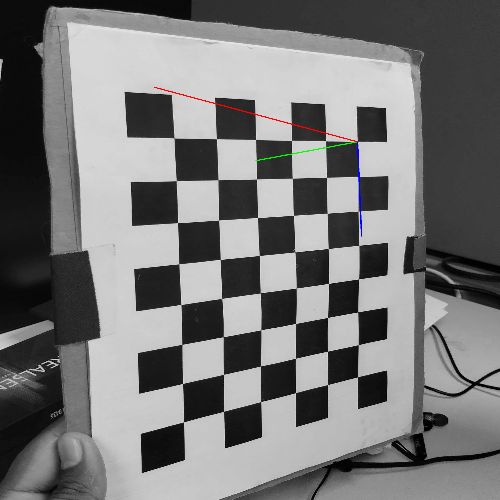

Distance from the camera: 36.086423031824516 units
(440, 115)


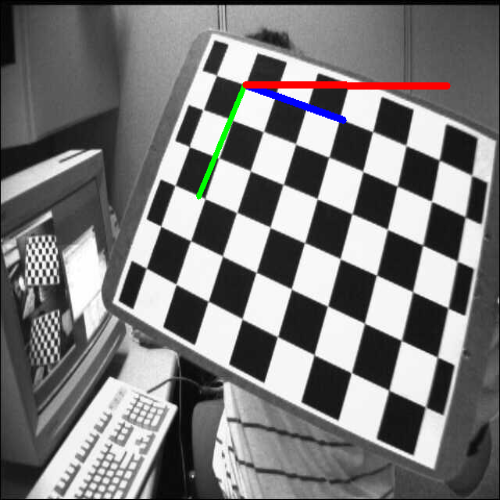

Distance from the camera: 38.044094137245594 units
(495, 179)


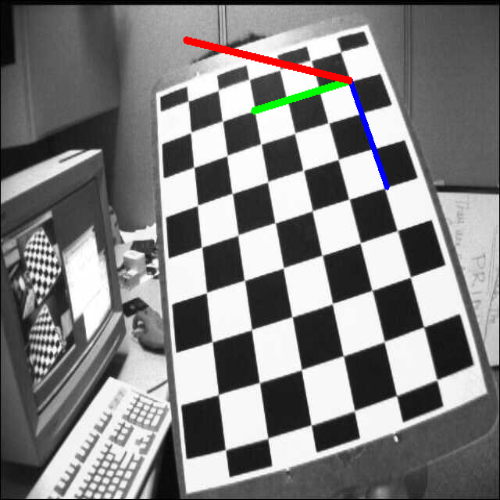

Distance from the camera: 38.51606434696881 units
(438, 217)


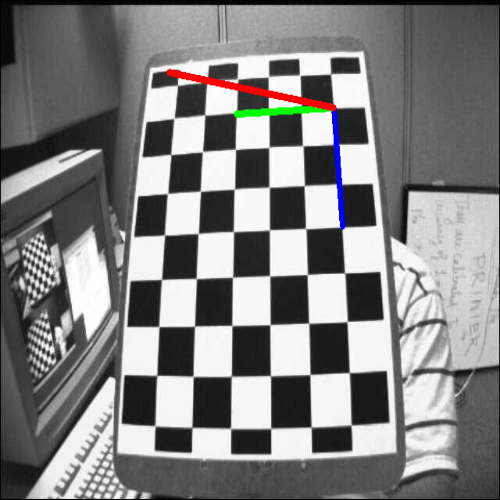

Distance from the camera: 55.472391617049205 units
(187, 217)


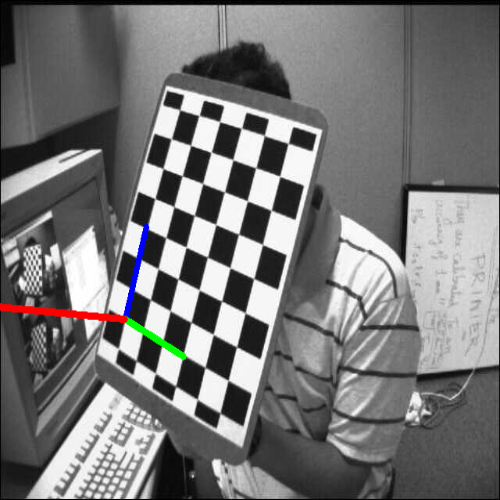

Distance from the camera: 43.923064668764304 units
(222, 247)


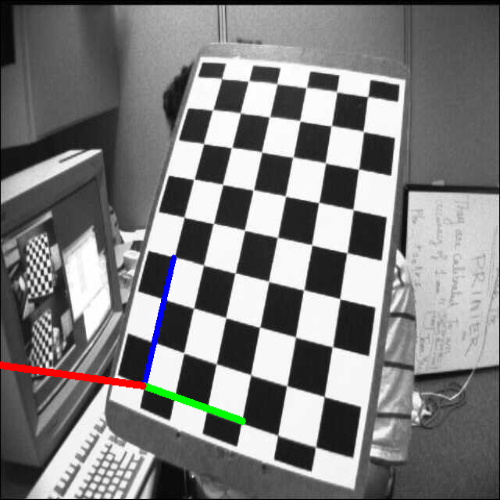

Distance from the camera: 38.43100908872111 units
(342, 113)


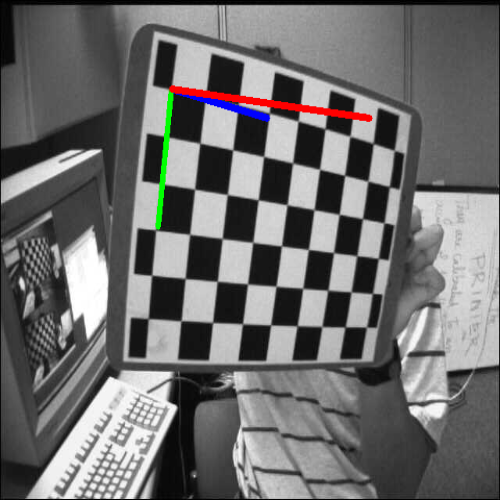

Distance from the camera: 50.60834172543835 units
(252, 233)


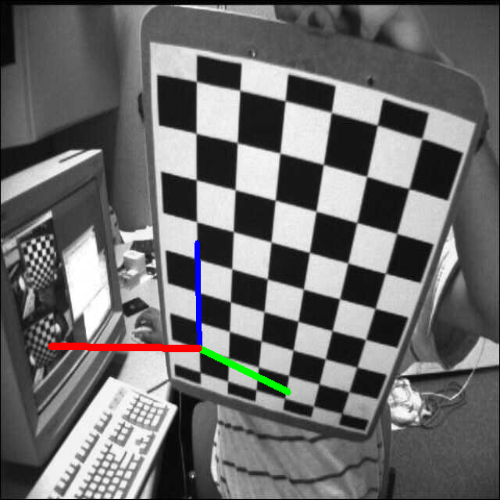

Distance from the camera: 41.41199660953573 units
(431, 172)


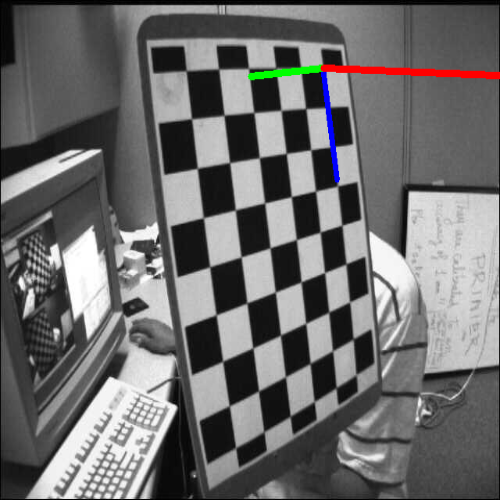

Distance from the camera: 40.96626985583886 units
(429, 171)


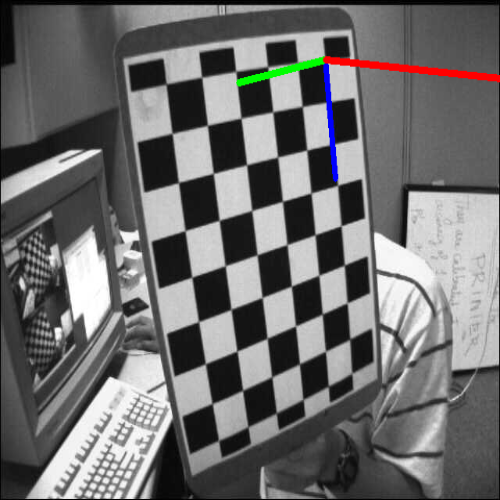

Distance from the camera: 50.85837867729063 units
(427, 183)


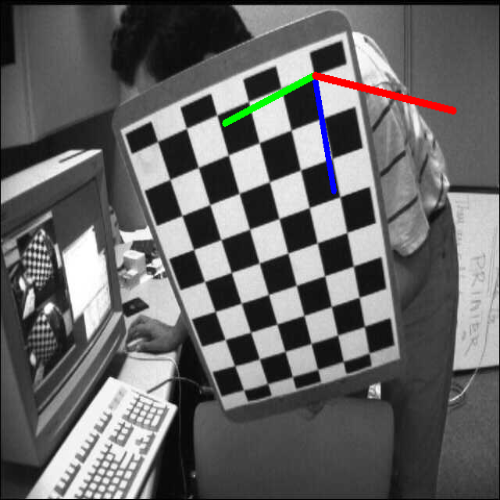

Distance from the camera: 42.2997565077892 units
(339, 121)


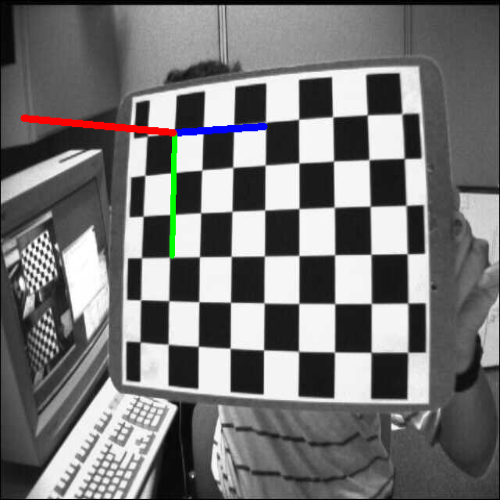

In [ ]:
for fname in images:
    # read image
    # TODO Part A (1): read the image from "fname" using cv2 imread
    img = cv2.imread(fname)
    # TODO Part A (2): convert img to gray scale using cvtColor using cv2.COLOR_BGR2GRAY parameter
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chess board corners
    # TODO Part A (3): find chess board corners using cv2 findChessboardCorners function, with "gray", grid size
    chessboard_size = (8, 6)
    ret, corners = cv2.findChessboardCorners(gray, chessboard_size, None)

    if ret == True:
        corners2 = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)

        # Find the rotation and translation vectors.
        # TODO Part A (7): Find rotation and translation matrix by calling cv2.solvePnP using objp, corners2, mtx and dist as parameters
        ret,rvecs, tvecs = cv2.solvePnP(objp, corners2, mtx, dist)

        # TODO Part B: Print the distance from the camera using np linalg norm function with tvecs as input and mention the unit of measurement in pdf
        distance = np.linalg.norm(tvecs)
        print(f"Distance from the camera: {distance} units")

        # Define 3D axis points in world coordinates
        axis = np.float32([[3,0,0], [0,3,0], [0,0,-3]]).reshape(-1,3)

        # project 3D points to image plane
        imgpts, jac = cv2.projectPoints(axis, rvecs, tvecs, mtx, dist)
        img = draw(img,corners2,imgpts)
        img = cv2.resize (img, (500, 500))
        # TODO Part A (4): display the image using cv2_imshow
        cv2_imshow(img)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


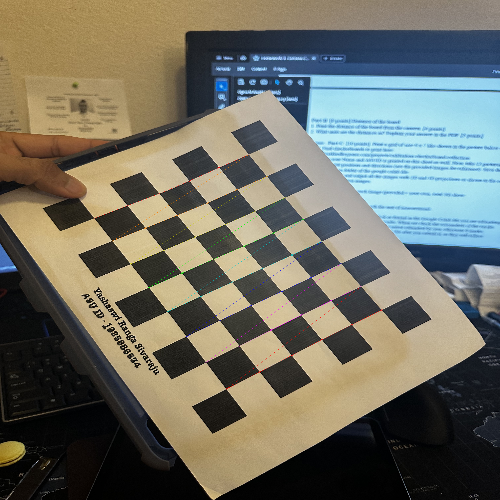

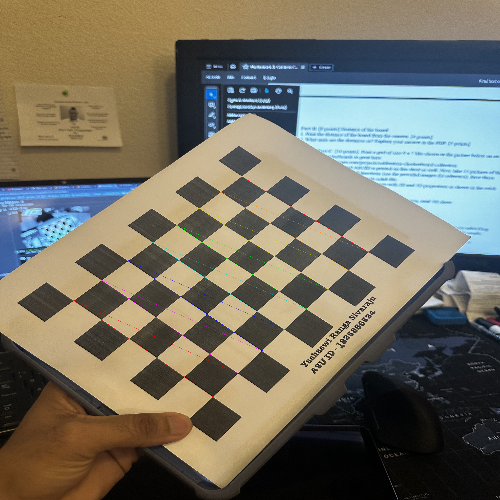

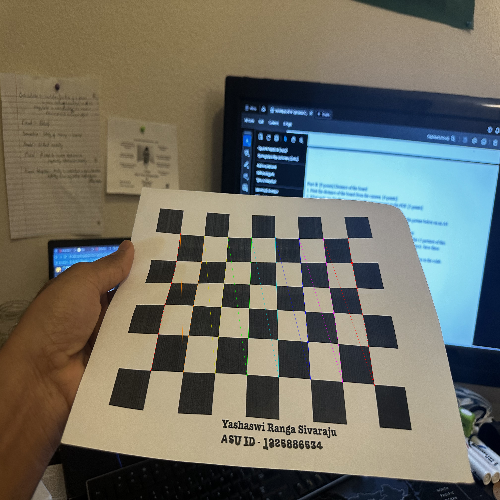

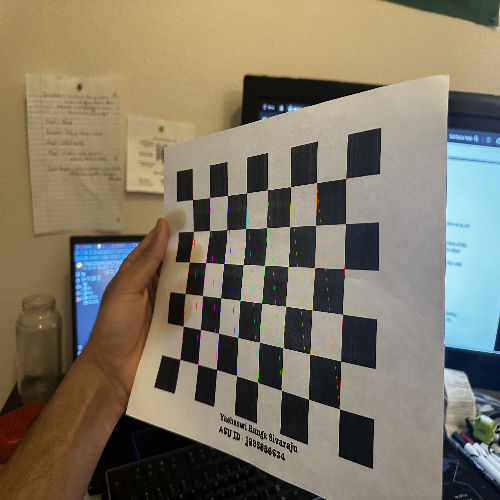

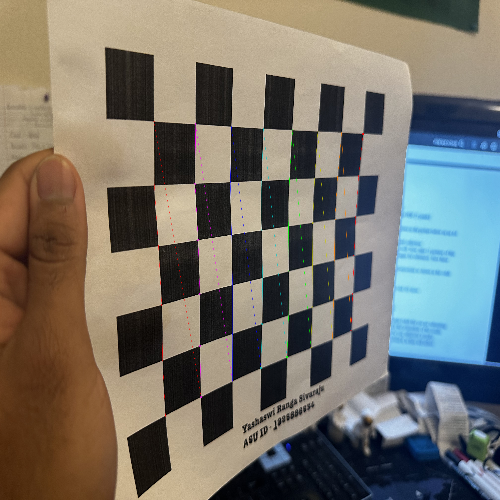

...

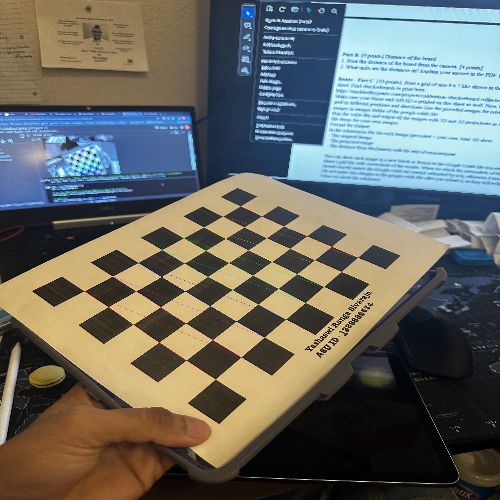

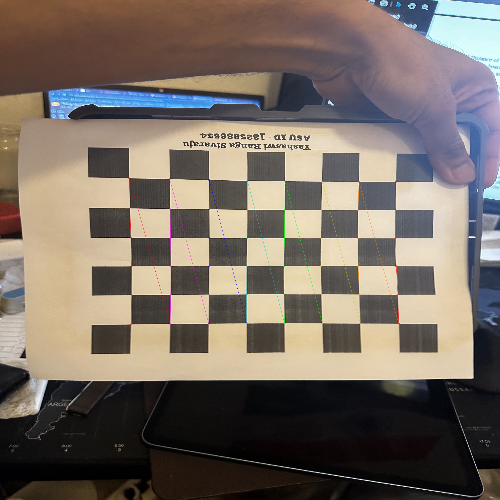

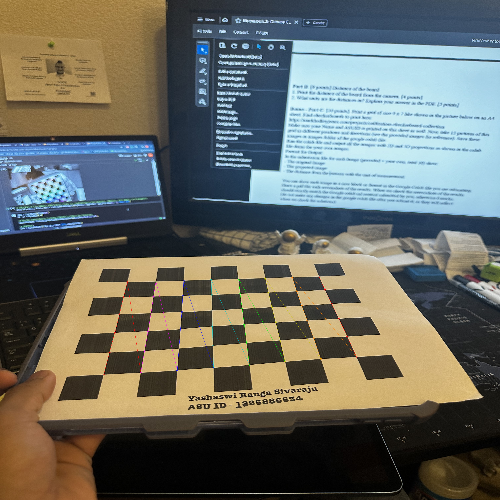

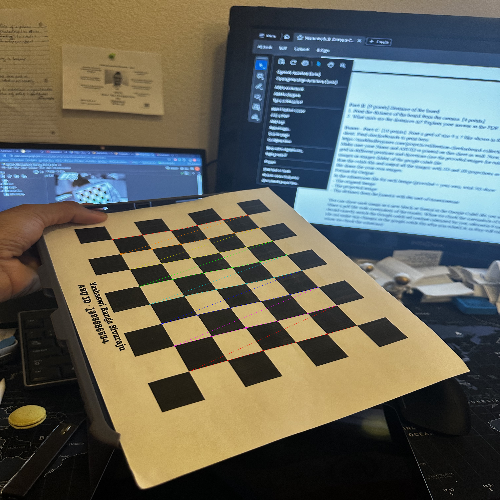

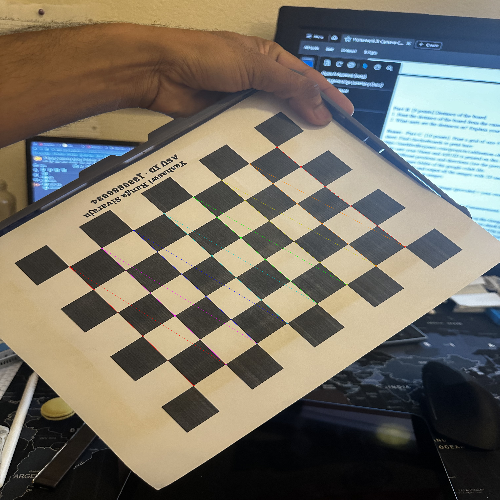

In [ ]:
import numpy as np
import cv2
import glob
from google.colab.patches import cv2_imshow
from google.colab import drive
import os

# !mkdir images (This should be a shell command, ensure it's executed properly if needed)
drive.mount('/content/drive')

images_dir = "/content/drive/My Drive/Perception/Assignment3/phone_images"

# Ensure this directory path is correct and contains the images
image_path_pattern = '/content/drive/My Drive/Perception/Assignment3/phone_images/*.jpg'
image_files = glob.glob(image_path_pattern)

# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*8,3), np.float32)
square_size = 25 # Assuming square size in millimeters
objp[:,:2] = np.mgrid[0:8,0:6].T.reshape(-1,2) * square_size

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.

# Variable to store the shape of the last gray image processed
img_gray_shape = None

images = glob.glob(image_path_pattern)
for fname in images:
    img = cv2.imread(fname)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Store the shape of the current grayscale image
    img_gray_shape = img_gray.shape[::-1]

    chessboard = (6,8)
    ret, corners = cv2.findChessboardCorners(img_gray, chessboard, None)

    if ret == True:
        objpoints.append(objp)
        corners2 = cv2.cornerSubPix(img_gray, corners, (11,11), (-1,-1), criteria)
        imgpoints.append(corners2)

        # Draw and display the corners
        img_with_corners = cv2.drawChessboardCorners(img, chessboard, corners2, ret)
        img_with_corners = cv2.resize(img_with_corners, (500, 500))
        cv2_imshow(img_with_corners)
        cv2.waitKey(500)  # Pause to display images; adjust as needed or remove
cv2.destroyAllWindows()

# Now, img_gray_shape contains the shape of the last processed grayscale image
# Use it for camera calibration
if img_gray_shape is not None:
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_gray_shape, None, None)
else:
    print("No images were processed.")


Distance from the camera: 4705.95 mm
(1514, 1249)


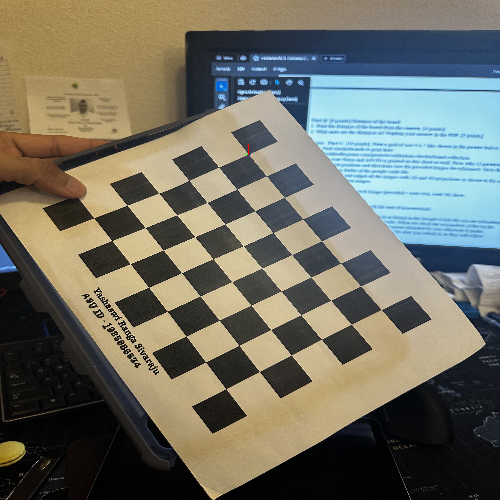

Distance from the camera: 4744.56 mm
(553, 2475)


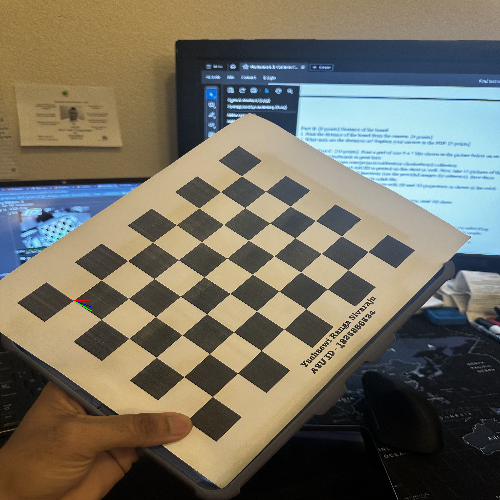

Distance from the camera: 4122.74 mm
(1369, 1393)


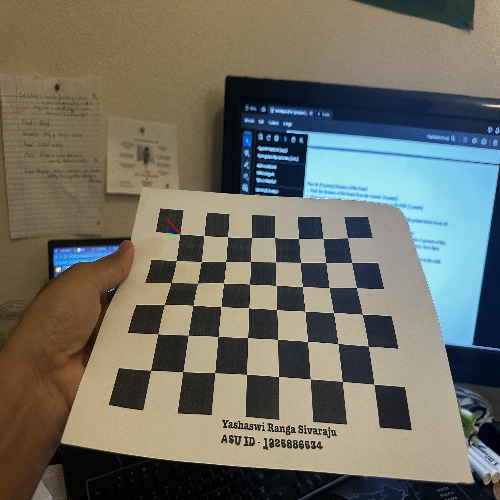

Distance from the camera: 5145.43 mm
(1528, 1109)


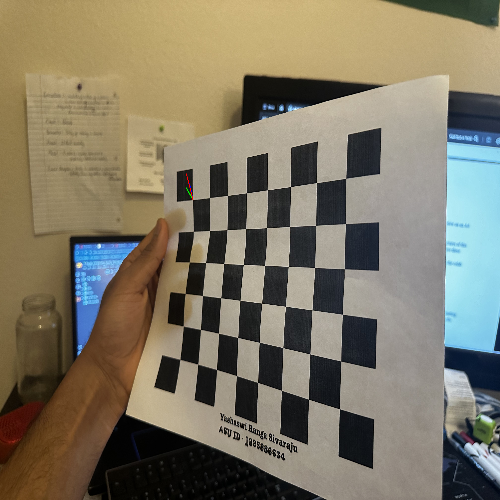

Distance from the camera: 3995.28 mm
(1376, 908)


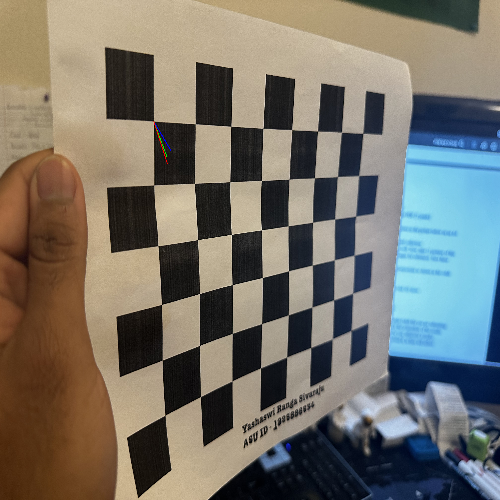

Distance from the camera: 2883.77 mm
(993, 758)


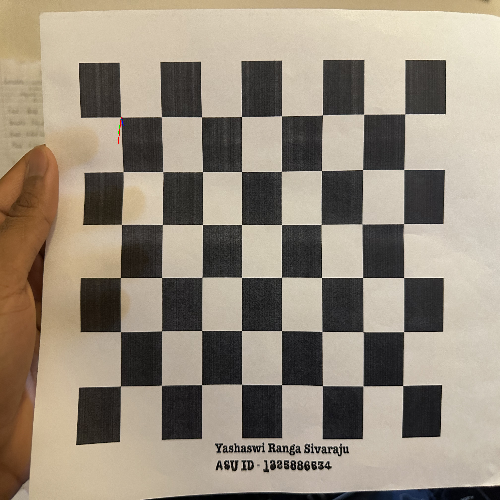

Distance from the camera: 4783.21 mm
(1152, 1150)


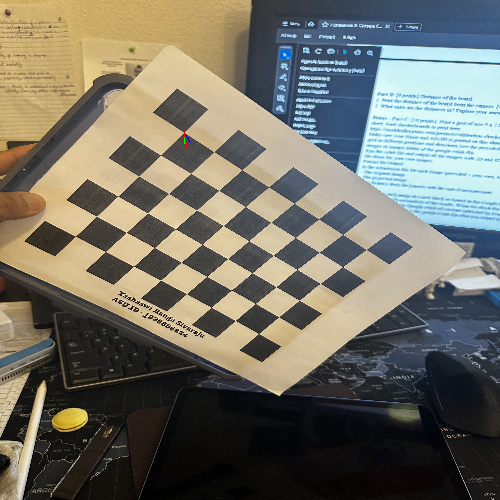

Distance from the camera: 5486.89 mm
(848, 1742)


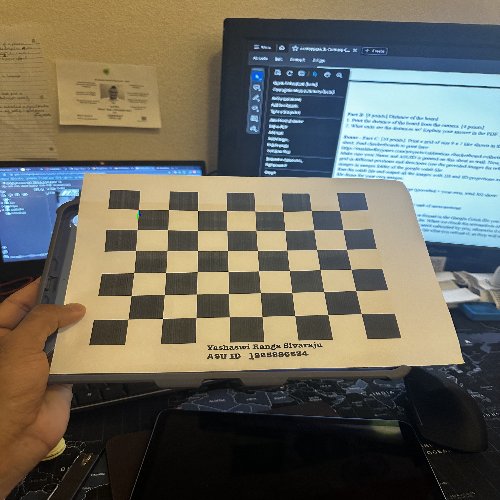

Distance from the camera: 5135.64 mm
(1537, 1495)


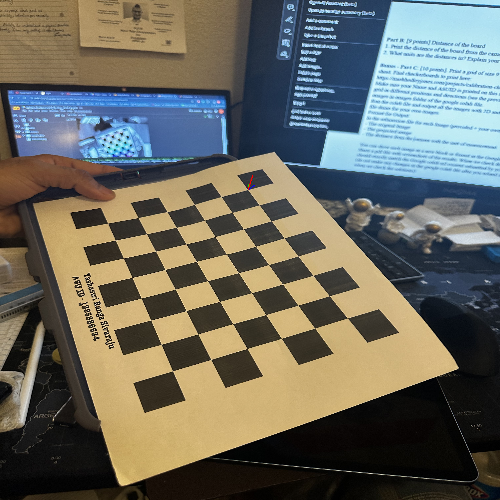

Distance from the camera: 5136.41 mm
(614, 2425)


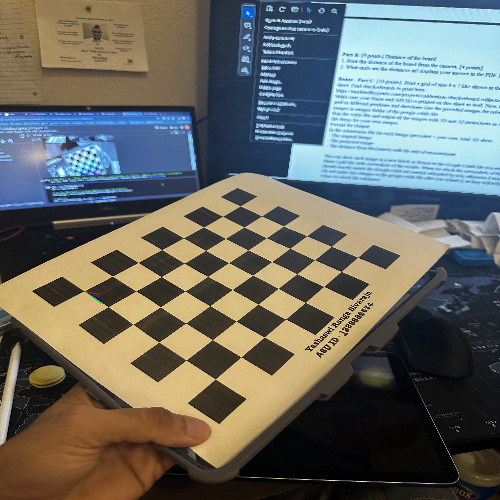

Distance from the camera: 4243.53 mm
(831, 1510)


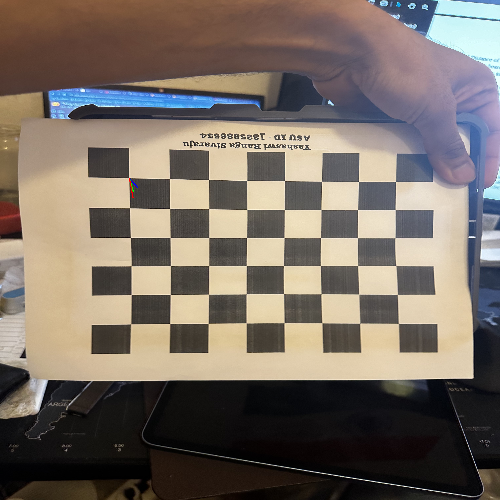

Distance from the camera: 5395.66 mm
(736, 2313)


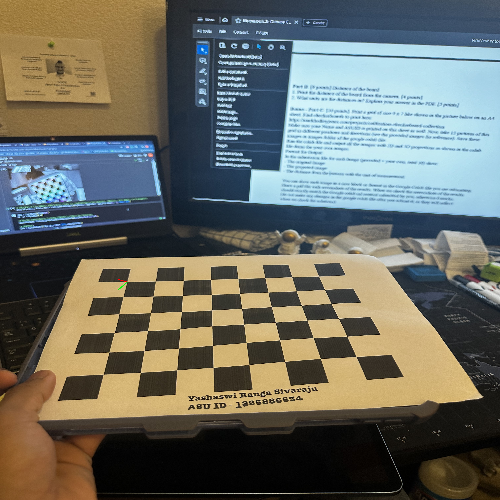

Distance from the camera: 5216.74 mm
(1532, 1682)


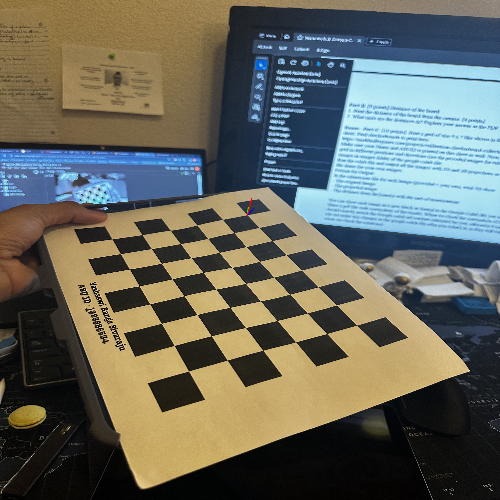

Distance from the camera: 4225.36 mm
(511, 2235)


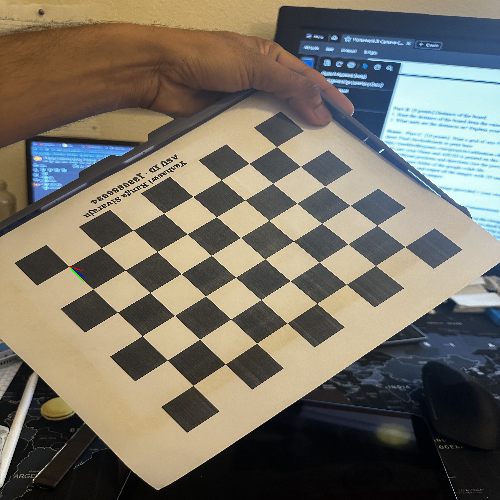

In [ ]:
import numpy as np
import cv2
import glob
from google.colab.patches import cv2_imshow
# Make sure your Google Drive is mounted and you've navigated to the correct directory

# Define the termination criteria for corner refinement
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# Prepare object points based on the actual chessboard size
square_size = 25  # Actual size of chessboard squares in mm or any unit you prefer
objp = np.zeros((6*8, 3), np.float32)
objp[:,:2] = np.mgrid[0:8,0:6].T.reshape(-1, 2) * square_size

# Arrays to store object points and image points from all the images
objpoints = []  # 3D points in real world space
imgpoints = []  # 2D points in image plane

# Assuming 'images' contains paths to your chessboard images
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Attempt to find the chessboard corners
    chessboard_size = (8, 6)
    ret, corners = cv2.findChessboardCorners(gray, chessboard_size, None)

    if ret:
        # Refine corner locations and update point arrays
        corners2 = cv2.cornerSubPix(gray, corners, (11, 11), (-1, -1), criteria)
        objpoints.append(objp)
        imgpoints.append(corners2)

        # Find rotation and translation vectors
        _, rvecs, tvecs = cv2.solvePnP(objp, corners2, mtx, dist)

        # Calculate the distance from the camera to the chessboard
        distance = np.linalg.norm(tvecs)
        print(f"Distance from the camera: {distance:.2f} mm")  # Assuming mm as the unit

        # Project 3D points (axis) to the image plane
        axis = np.float32([[3,0,0], [0,3,0], [0,0,-3]]).reshape(-1,3)
        imgpts, _ = cv2.projectPoints(axis, rvecs, tvecs, mtx, dist)

        # Draw the 3D axis on the image
        img = draw(img, corners2, imgpts)
        img_resized = cv2.resize(img, (500, 500))
        cv2_imshow(img_resized)
        cv2.waitKey(500)  # Pause to display each image
cv2.destroyAllWindows()
def draw(img, corners, imgpts):
    corner = tuple(corners[0].ravel())
    img = cv2.line(img, corner, tuple(imgpts[0].ravel()), (255,0,0), 5)
    img = cv2.line(img, corner, tuple(imgpts[1].ravel()), (0,255,0), 5)
    img = cv2.line(img, corner, tuple(imgpts[2].ravel()), (0,0,255), 5)
    return img


In [ ]:
##TEST SPACE
import numpy as np

# Define the chessboard size
chessboard_size = (8, 6)

# Prepare object points (0,0,0), (1,0,0), (2,0,0) ....,(7,5,0)
objp = np.zeros((chessboard_size[0]*chessboard_size[1], 3), np.float32)
square_size = 1 #1mm
objp[:,:2] = np.mgrid[0:chessboard_size[0], 0:chessboard_size[1]].T.reshape(-1, 2)*square_size

# Print the 'objp' to see the filled coordinates
print("objp (A single set of object points):")
print(objp)

# Suppose we have found corners in two images, and we want to append 'objp' twice to 'objpoints'
objpoints = [] # List to store object points from all images

# Simulating the process of finding corners in two images
objpoints.append(objp) # Appending object points for the first image
objpoints.append(objp) # Appending object points for the second image

# Print 'objpoints' to see how it stores object points for multiple images
print("\nobjpoints (Object points from multiple images):")
for i, op in enumerate(objpoints):
    print(f"Object points for image {i+1}:")
    print(op)


objp (A single set of object points):
[[0. 0. 0.]
 [1. 0. 0.]
 [2. 0. 0.]
 [3. 0. 0.]
 [4. 0. 0.]
 [5. 0. 0.]
 [6. 0. 0.]
 [7. 0. 0.]
 [0. 1. 0.]
 [1. 1. 0.]
 [2. 1. 0.]
 [3. 1. 0.]
 [4. 1. 0.]
 [5. 1. 0.]
 [6. 1. 0.]
 [7. 1. 0.]
 [0. 2. 0.]
 [1. 2. 0.]
 [2. 2. 0.]
 [3. 2. 0.]
 [4. 2. 0.]
 [5. 2. 0.]
 [6. 2. 0.]
 [7. 2. 0.]
 [0. 3. 0.]
 [1. 3. 0.]
 [2. 3. 0.]
 [3. 3. 0.]
 [4. 3. 0.]
 [5. 3. 0.]
 [6. 3. 0.]
 [7. 3. 0.]
 [0. 4. 0.]
 [1. 4. 0.]
 [2. 4. 0.]
 [3. 4. 0.]
 [4. 4. 0.]
 [5. 4. 0.]
 [6. 4. 0.]
 [7. 4. 0.]
 [0. 5. 0.]
 [1. 5. 0.]
 [2. 5. 0.]
 [3. 5. 0.]
 [4. 5. 0.]
 [5. 5. 0.]
 [6. 5. 0.]
 [7. 5. 0.]]

objpoints (Object points from multiple images):
Object points for image 1:
[[0. 0. 0.]
 [1. 0. 0.]
 [2. 0. 0.]
 [3. 0. 0.]
 [4. 0. 0.]
 [5. 0. 0.]
 [6. 0. 0.]
 [7. 0. 0.]
 [0. 1. 0.]
 [1. 1. 0.]
 [2. 1. 0.]
 [3. 1. 0.]
 [4. 1. 0.]
 [5. 1. 0.]
 [6. 1. 0.]
 [7. 1. 0.]
 [0. 2. 0.]
 [1. 2. 0.]
 [2. 2. 0.]
 [3. 2. 0.]
 [4. 2. 0.]
 [5. 2. 0.]
 [6. 2. 0.]
 [7. 2. 0.]
 [0. 3. 0.]
 [1. 3. 0